# House Prices - Advanced Regression Techniques

## Kaggle competition

### Sebastián Ayala Ruano 

## **Import libraries**

In [1]:
import pandas as pd
from pandas_profiling import ProfileReport

import numpy as np
from scipy import stats

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

## **Load data and EDA**

In [3]:
# To load data, we used an auxiliar function for transforming NAs to None due to some valida categories from the dataset are called NA.
def NA2None(cell):
    if cell == "NA":
        return "None"
    
NA_converter = {"Alley": NA2None, "BsmtQual": NA2None, "BsmtCond": NA2None, 
                "BsmtExposure": NA2None, "BsmtFinType1": NA2None, "BsmtFinType2": NA2None,
                "GarageType": NA2None, "GarageFinish": NA2None, "GarageQual": NA2None,
                "GarageCond": NA2None, "PoolQC": NA2None, "Fence": NA2None, "MiscFeature": NA2None, 
                "FireplaceQu": NA2None}

# Load trainig and test datasets applying the auxiliar function 
df_train = pd.read_csv('Data/train_House_Prices_Advanced_Regression_Techniques.csv', converters=NA_converter) 
df_test = pd.read_csv('Data/test_House_Prices_Advanced_Regression_Techniques.csv', converters=NA_converter) 

# Show train dataset
df_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,4,2010,WD,Normal,142125


In [4]:
# Check features data types and null values 
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          1369 non-null   object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [5]:
# Numerical features description 
df_train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [9]:
# EDA with pandas profiling 
profile = ProfileReport(df_train, title="Pandas Profiling Report", interactions=None)

profile

Render HTML: 100%|██████████| 1/1 [00:04<00:00,  4.31s/it]


## **Data processing**

In [10]:
# Delete features with a 10% or greater percentage of missing values 
def DeleteColumnsNa(df):
    # Filtering columns with a 10% or greater percentage of missing values  
    temp = pd.DataFrame(df.isna().sum()/len(df) >= 0.1)
    colmunsNa = temp[temp[0] == True]
    # Deleting columns with a 10% or greater percentage of missing values 
    for column in colmunsNa.index:
        df = df.drop([column], axis=1)
    return df

df_train_tr1 = DeleteColumnsNa(df_train)

# Delete ID column 
df_train_tr1 = df_train_tr1.drop(["Id"], axis=1)

df_train_tr1.shape

(1460, 68)

## **Features selection**

Text(0.5, 1.0, 'Correlation between features and target variable')

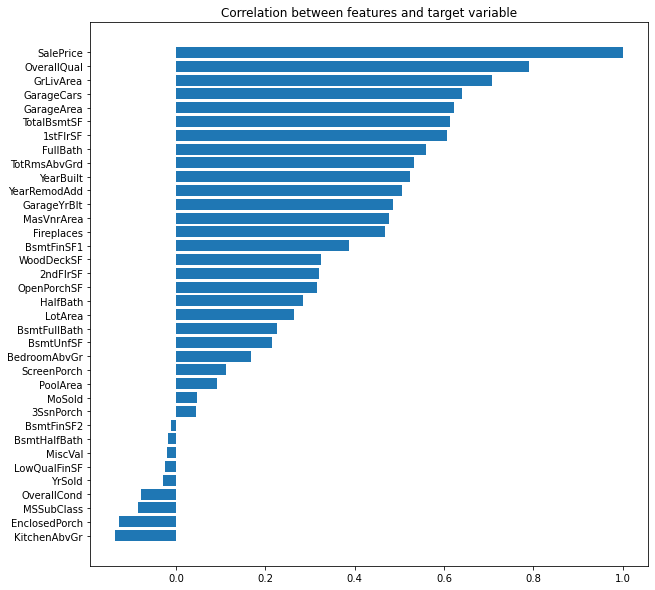

In [11]:
# We considered the correlation between numerical features and target variable 

corr_df = pd.DataFrame(df_train_tr1.corrwith(df_train_tr1["SalePrice"]), columns = ["Corr"])

corr_df = corr_df.sort_values(by=['Corr'])

# Set figure and axes
fig, ax = plt.subplots()

# Figure size 
fig.set_size_inches(10,10)

plt.barh(y=corr_df.index, width=corr_df.Corr)

# Add title
plt.title('Correlation between features and target variable')

The previous plot showed that the best numerical variables to be used as model features are:
* OverallQual
* GrLivArea
* GarageCars
* GarageArea
* TotalBsmtSF

In [12]:
# Create lists of numerical and categorical variables 
cat_columns = [c for c in df_train_tr1.columns if df_train_tr1[c].dtype == object]
print("cat", cat_columns)

num_columns = [c for c in df_train_tr1.columns if df_train_tr1[c].dtype in [int, float]]
print("num", num_columns)

cat ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'PavedDrive', 'PoolQC', 'MiscFeature', 'SaleType', 'SaleCondition']
num ['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']


Intuitively, we should add these categorical variables to the model: 
* Utilities (nominal)
* LotShape (ordinal)
* MSZoning (nominal)
* Condition1 (nominal)
* ExterQual (ordinal)
* ExterCond (ordinal)

Applying different combinations of these variables, we will create our regression model. 

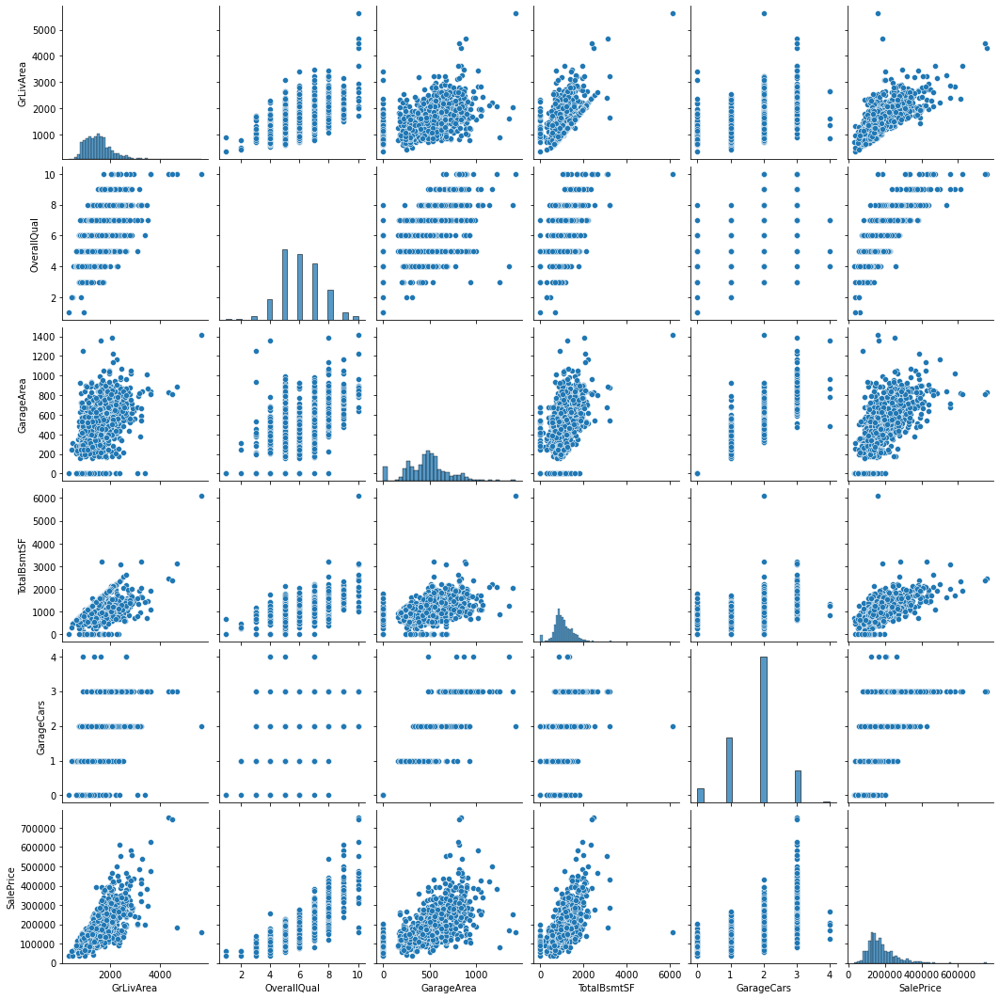

In [13]:
# Filtering model features and target variable  
features_col = ["GrLivArea", "OverallQual", "GarageArea", "TotalBsmtSF","GarageCars",
                "LotShape", "ExterQual", "ExterCond", "MSZoning", "Utilities", "Condition1", "SalePrice"]

features_df = pd.DataFrame(df_train_tr1.loc[:, features_col].values, columns=["GrLivArea", "OverallQual", "GarageArea", "TotalBsmtSF", "GarageCars",
               "LotShape", "ExterQual", "ExterCond", "MSZoning","Utilities", "Condition1", "SalePrice"])

# Plot to visualize interactions and distributions of numerical variables 
sns.pairplot(features_df)

## **Data cleaning**
The scatter plot between *GrLivArea* y *SalePrice* showed that there are some negative values, so we filtered these values. Also, we took into account sales that were done on normal conditions, filtering the *SaleCondition* feature. 

In [14]:
# Applying criteria to filter data 
criteria = (df_train_tr1.GrLivArea <= 2500) & (df_train.SaleCondition == "Normal")

df_train_tr1 = df_train_tr1.loc[criteria]

## **Features transformations**
We performed transformations of numerical and categorical (ordinal and nominal) features. 

In [15]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, RobustScaler, OrdinalEncoder
from sklearn.impute import SimpleImputer

# Define transformations of features 
preprocessor = make_column_transformer(
    (RobustScaler(quantile_range=(25, 75)), [0, 1, 2, 3, 4]),
    (OrdinalEncoder(categories=[("Reg", "IR1", "IR2", "IR3")]), [5]),
    (OrdinalEncoder(categories=[("Ex", "Gd", "TA", "Fa", "Po")]), [6]),
    (OrdinalEncoder(categories=[("Ex", "Gd", "TA", "Fa", "Po")]), [7]),
    (OneHotEncoder(), [8,9,10]),
    remainder='passthrough'
)
imputer = make_column_transformer(
    (SimpleImputer(strategy="mean"), [0, 1, 2, 3, 4]),
    (SimpleImputer(strategy="most_frequent"), [5,6,7,8,9,10]))

## **Input matrix, output vector, and results storage dictionary**

In [16]:
features_col.remove("SalePrice")
X_train = df_train_tr1.loc[:, features_col].values
X_test = df_test.loc[:, features_col].values
y_train = df_train_tr1.loc[:, "SalePrice"].values

results = {}

## **Regression models**
We testet three regression models: 
* Ridge Regression (l2 norm)
* Lasso Regression (l1 norm)
* Elastic Net Regression (l1 and l2 norms)

### **Regression models without target variable transformation**

In [17]:
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
from sklearn.linear_model import ElasticNetCV
from sklearn.pipeline import make_pipeline

# Define regressors with cross-validation to determine the best hyperparameters, and applying 
# data pre-processing pipelines defined aearlier
RLassoCV = make_pipeline(
    imputer,
    preprocessor,
    LassoCV(alphas=[1e-3, 1e-2, 1e-1, 1, 100, 1000], cv=5))
RLRidgeCV = make_pipeline(
    imputer,
    preprocessor,
    RidgeCV(alphas=[1e-3, 1e-2, 1e-1, 1, 100, 1000], cv=5))
RLElasticNetCV = make_pipeline(
    imputer,
    preprocessor,
    ElasticNetCV(l1_ratio = [.1, .5, .7, .9, .95, .99, 1], cv=5))

### **Regression models with log(exp) target variable transformation**

In [19]:
from sklearn.compose import TransformedTargetRegressor
# Define regresors with target variable transformation 
def log_transformer(model):
  return TransformedTargetRegressor(
      regressor=model, 
      func=np.log1p,         # log(1 + x)
      inverse_func=np.expm1  # exp(x) - 1
  )

RLassoCVLog = log_transformer(RLassoCV)
RLRidgeCVLog = log_transformer(RLRidgeCV)
RLElasticNetCVLog = log_transformer(RLElasticNetCV)

### **Applying cross-validation for all models and saving results**

In [20]:
from sklearn.model_selection import cross_validate

# Cross validation and saving results
def cross_val(models):
    for model in models:
      cv_scores = cross_validate(model, X_train, y_train, cv=5, scoring="neg_mean_squared_error")
      results[model] = cv_scores

reg = [RLassoCV, RLRidgeCV, RLElasticNetCV, RLassoCVLog, RLRidgeCVLog, RLElasticNetCVLog]
cross_val(reg)

## **Models comparison**

In [22]:
# Filtering results dictionary to obtain only the values from scores to make comparisons
metric_to_plot = "test_score"
results_to_plot = {}

for reg_name in results:
    results_to_plot[reg_name] = results[reg_name][metric_to_plot] * -1.0

# Df of scores
results_to_plot = pd.DataFrame(results_to_plot)
results_to_plot.columns = ["RLassoCV", "RLRidgeCV", "RLElasticNetCV",  
                           "RLassoCVLog", "RLRidgeCVLog", "RLElasticNetCVLog"]

results_to_plot

,RLassoCV,RLRidgeCV,RLElasticNetCV,RLassoCVLog,RLRidgeCVLog,RLElasticNetCVLog
0,5.389701e+08,5.355096e+08,5.401067e+08,5.065878e+08,4.990150e+08,4.980602e+08
1,8.725836e+08,8.801738e+08,8.761510e+08,6.234808e+08,6.209213e+08,6.191281e+08
2,5.581516e+08,5.602691e+08,5.604226e+08,3.880059e+08,3.907804e+08,3.897049e+08
3,5.556552e+08,5.553502e+08,5.618620e+08,4.576758e+08,4.595799e+08,4.582351e+08
4,6.331636e+08,6.472556e+08,6.333089e+08,5.248753e+08,5.366652e+08,5.285581e+08


[Text(0, 0, 'RLassoCV'),
 Text(1, 0, 'RLRidgeCV'),
 Text(2, 0, 'RLElasticNetCV'),
 Text(3, 0, 'RLassoCVLog'),
 Text(4, 0, 'RLRidgeCVLog'),
 Text(5, 0, 'RLElasticNetCVLog')]

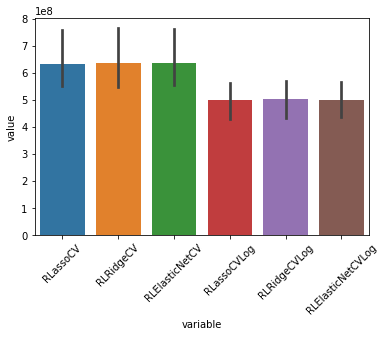

In [23]:
# Barplot to identify the best model
chart = sns.barplot(x="variable", y="value" ,data=results_to_plot.melt())

chart.set_xticklabels(chart.get_xticklabels(), rotation=45)

The plot does not allow us to identify the best model, so we will check the mean of the scores of the best 3 models as a quantitaive measure to identify the best model. 

In [26]:
best_model_to_plot.describe()

,RLassoCVLog,RLRidgeCVLog,RLElasticNetCVLog
count,5.000000e+00,5.000000e+00,5.000000e+00
mean,5.001251e+08,5.013924e+08,4.987373e+08
std,8.695349e+07,8.590732e+07,8.501792e+07
min,3.880059e+08,3.907804e+08,3.897049e+08
25%,4.576758e+08,4.595799e+08,4.582351e+08
50%,5.065878e+08,4.990150e+08,4.980602e+08
75%,5.248753e+08,5.366652e+08,5.285581e+08
max,6.234808e+08,6.209213e+08,6.191281e+08


Considering the man of all scores by each model, **RLElasticNetCVLog** is the bets model. 

## **Train the best model and predictions on the test dataset**

In [615]:
# Training the model with all training dataset 
RLElasticNetCVLog.fit(X_train, y_train)  

# Predictions on the test dataset
y_pred = RLElasticNetCVLog.predict(X_test) 

# Create file to upload results in Kaggle competition 

submission_df = pd.DataFrame({"Id": df_test.loc[:, "Id"], 
                              "SalePrice": y_pred})

submission_df.to_csv("submission_RLElasticNetCVLog.csv", index=False)

## **Results obtained in the Kaggle competition**
The score (Root mean squared logarithmic error) obtained in the [competition](https://www.kaggle.com/c/house-prices-advanced-regression-techniques) was **0.16569**. 

